In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%load_ext tensorboard
import os

if not os.path.isdir('./HypernetworkSiren'):
  !git clone https://github.com/ZrbTz/HypernetworkSiren.git
  !bash -c 'mv ./HypernetworkSiren/* ./'

from hypersiren import *

In [ ]:
from hypersiren import *
print_CUDA_memory_statistics()

#put this to true if you want to resume a previous training
restore = False
data_augmentation = True

## SUPER RESOLUTION PARAMETERS ##
datasetTrainingPath = "/content/images/DIV2K_train_HR"
datasetValidationPath = "/content/images/DIV2K_valid_HR"
datasetTestPath = "/content/images/Set14"
epochs = 1000
steps_til_summary = 100
max_num_images = 800
max_val_images = 100
max_test_images = 14
batch_size = 25
hidden_features = 128
better_params = (30, 30, 2e-5, 0.1)
lambda_latent = 1e-1
lambda_weights = 1e2
lambda_biases = 1e2
width_LR = 64
height_LR = 64
factor = 4
width_HR = width_LR * factor
height_HR = height_LR * factor

## WRITER AND CHECKPOINT PATH ##
checkpoint_path = "/content/drive/MyDrive/backup_training/SIREN_PRIOR_BRANCH_HyperMetaAlexNet_DA_ep" + str(epochs) + "_im" + str(max_num_images) + ".chk"
writer_folder = "/content/drive/MyDrive/backup_training/SIREN_PRIOR_BRANCH_HyperMetaAlexNet_DA_ep" + str(epochs) + "_im" + str(max_num_images)

## DATALOADER ##
if data_augmentation:
  # set dataloader with DA
  training_dataloader = DataLoader(Hyper_ImageFitting_RGB_DA(datasetTrainingPath, width_LR, height_LR, factor, max = max_num_images, apply_random_transforms=True), batch_size=batch_size, pin_memory=True, num_workers=0, shuffle=True)
  validation_dataloader = DataLoader(Hyper_ImageFitting_RGB_DA(datasetValidationPath, width_LR, height_LR, factor, max = max_val_images), batch_size=10, pin_memory=True, num_workers=0, shuffle=True)
else:
  # set dataloader without DA
  training_dataloader = DataLoader(Hyper_ImageFitting_RGB(datasetTrainingPath, width_LR, height_LR, factor, max = max_num_images), batch_size=batch_size, pin_memory=True, num_workers=0, shuffle=True)
  validation_dataloader = DataLoader(Hyper_ImageFitting_RGB(datasetValidationPath, width_LR, height_LR, factor, max = max_val_images), batch_size=10, pin_memory=True, num_workers=0, shuffle=True)

## HYPERNETWORK ##
# VGG: vgg19
# AlexNet: HyperBaseAlexNet.hyperBaseAlexNet
# AlexNet with one FC for each SIREN layers: HyperBaseAlexNetFC.hyperBaseAlexNetFC
# AlexNet with one FC for each weight and bias of SIREN layers: HyperMetaAlexNet.hyperMetaAlexNet
# Hypernetwork with inception block and residual connection: InceptionAndResidual.hyperInceptionAndResidual
# Alexnet with a residual conjAlexWithResidual.hyperAlexWithResidual
hyper_siren = Hyp_Siren(in_features=2, out_features=3, hidden_features=hidden_features, hidden_layers=3, 
                           hypernetInit= HyperMetaAlexNet.hyperMetaAlexNet, first_omega_0=better_params[0], hidden_omega_0=better_params[1])

hyper_siren.cuda()

print_CUDA_memory_statistics()

writer = SummaryWriter(writer_folder)

## TRAINING ##
prior_train(hyper_siren, training_dataloader, validation_dataloader, writer,
            lr = better_params[2], gamma = better_params[3], width_HR = width_HR,
            height_HR = height_HR, total_steps = epochs, 
            steps_til_summary = steps_til_summary, lambda_latent = lambda_latent,
            lambda_weights = lambda_weights, lambda_biases = lambda_biases, 
            restore = restore, checkpoint_path = checkpoint_path)  

writer.flush()

print_CUDA_memory_statistics()


CUDA-0 used memory [0 bytes / 16914055168 bytes (0.00%)]
CUDA-0 used memory [474228736 bytes / 16914055168 bytes (2.80%)]
=> loading checkpoint '/content/drive/MyDrive/backup_training/SIREN_PRIOR_BRANCH_HyperMetaAlexNet_DA_ep1000_im800.chk'
=> loaded checkpoint '/content/drive/MyDrive/backup_training/SIREN_PRIOR_BRANCH_HyperMetaAlexNet_DA_ep1000_im800.chk' (epoch 1000)
CUDA-0 used memory [474228736 bytes / 16914055168 bytes (2.80%)]


CUDA-0 used memory [474228736 bytes / 16914055168 bytes (2.80%)]
[image 1/14 - 7.14%]
torch.Size([256, 256, 3])
Running on GPU 0


./srgan/models/weight_inits.py:101: UserWarning: nn.init.orthogonal is now deprecated in favor of nn.init.orthogonal_.
  _get_init_fn(weight_init)(m.weight.data)
./srgan/models/weight_inits.py:103: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  _get_init_fn(bias_init)(m.bias.data)
./srgan/models/weight_inits.py:101: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  _get_init_fn(weight_init)(m.weight.data)


Restored checkpoint from srgan/resources/pretrained/srgan.pth


./srgan/training/base_runner.py:37: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  batch = [Variable(tensor, volatile=volatile) for tensor in batch]


Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:0:15 / 0:3:35


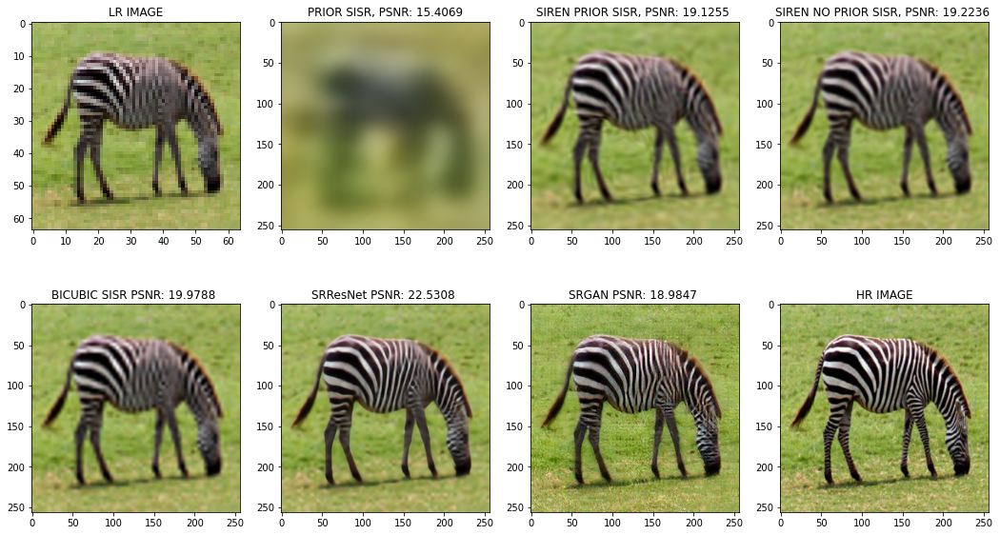

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 2/14 - 14.29%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:0:32 / 0:3:50


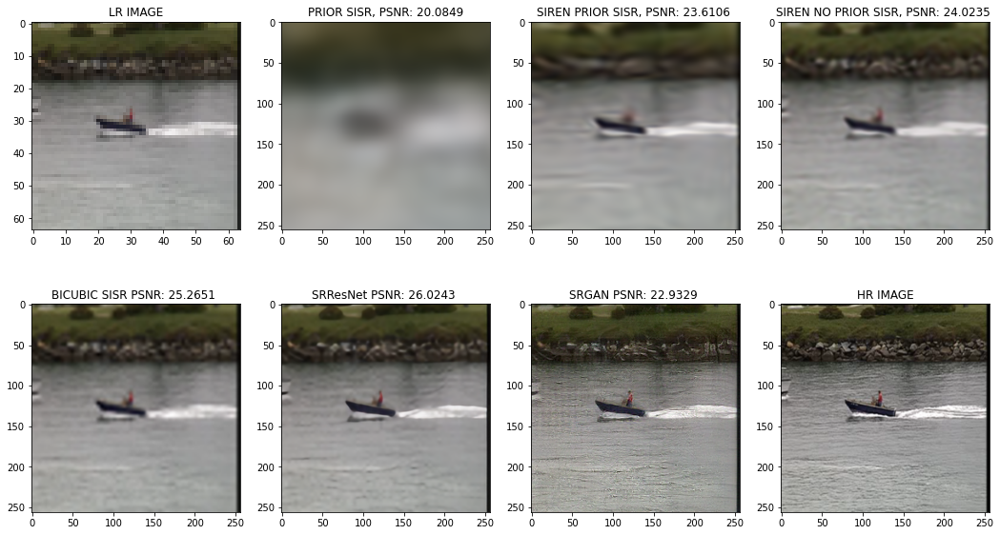

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 3/14 - 21.43%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:0:49 / 0:3:53


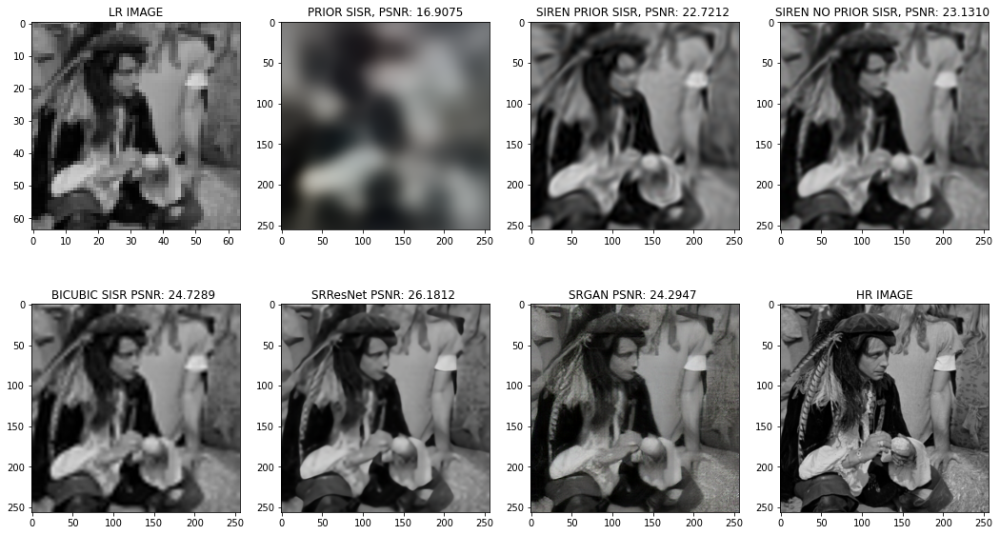

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 4/14 - 28.57%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:1:5 / 0:3:50


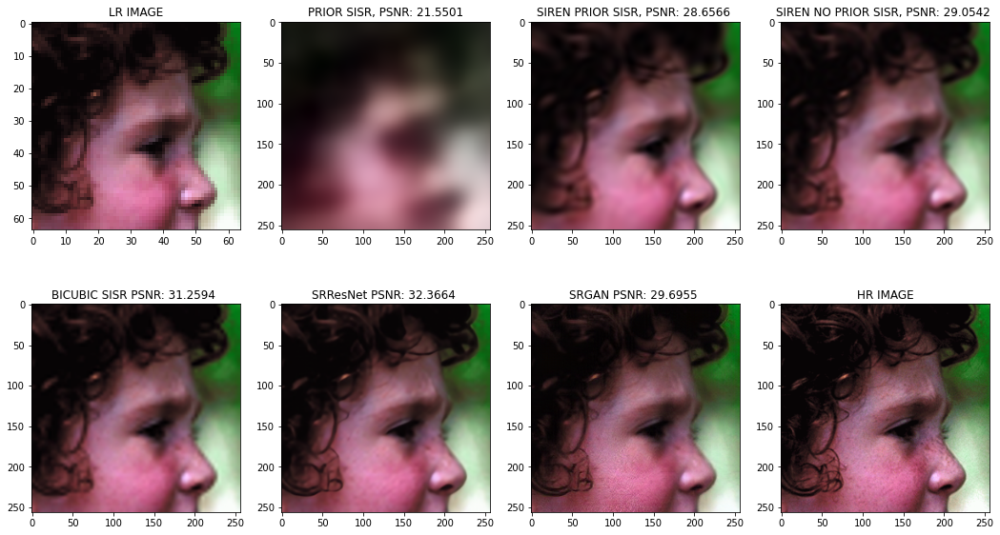

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 5/14 - 35.71%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:1:23 / 0:3:52


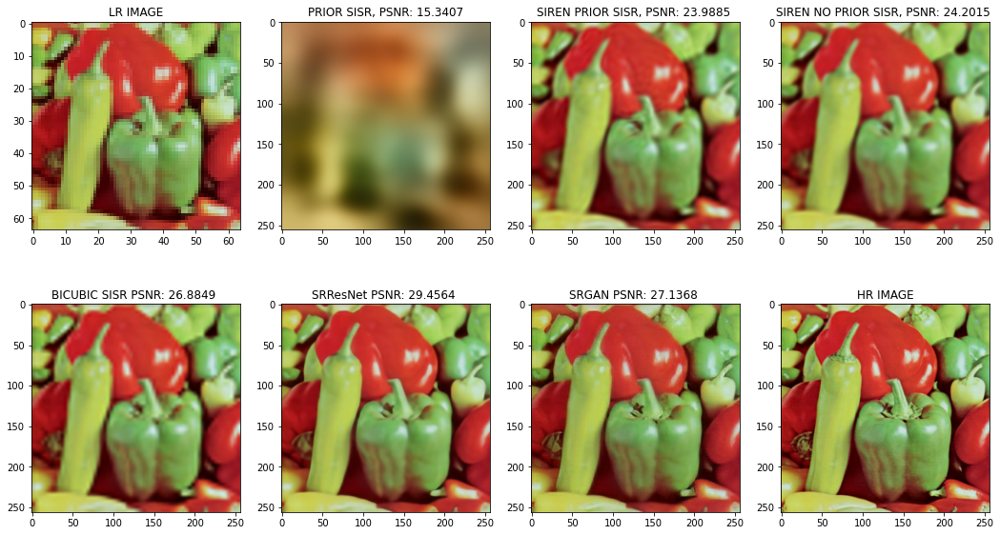

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 6/14 - 42.86%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:1:42 / 0:3:59


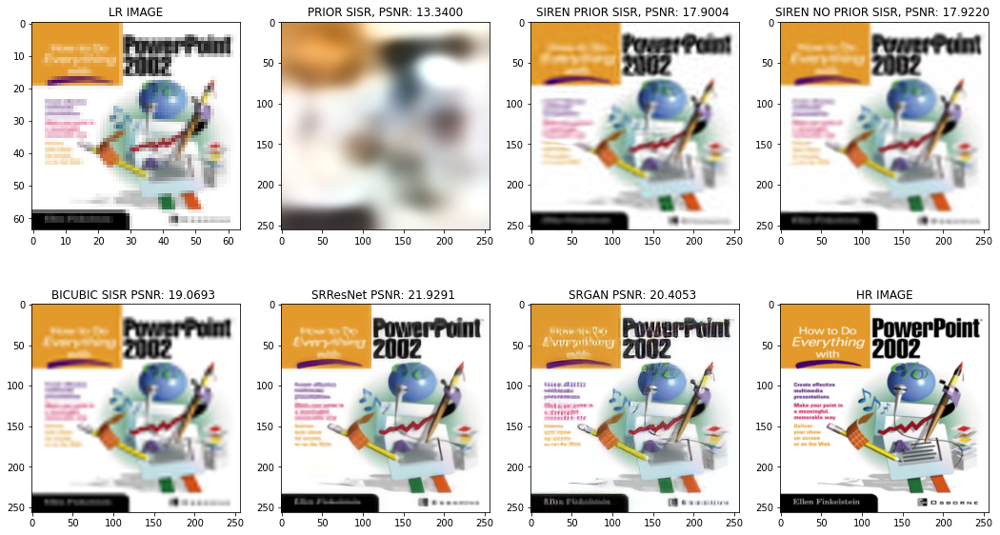

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 7/14 - 50.00%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:1:53 / 0:3:47


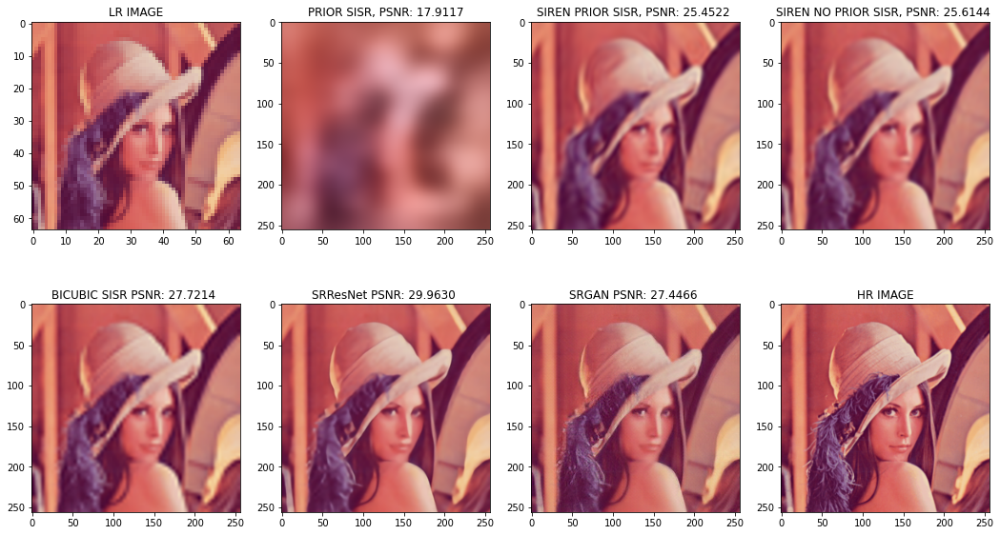

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 8/14 - 57.14%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:2:14 / 0:3:55


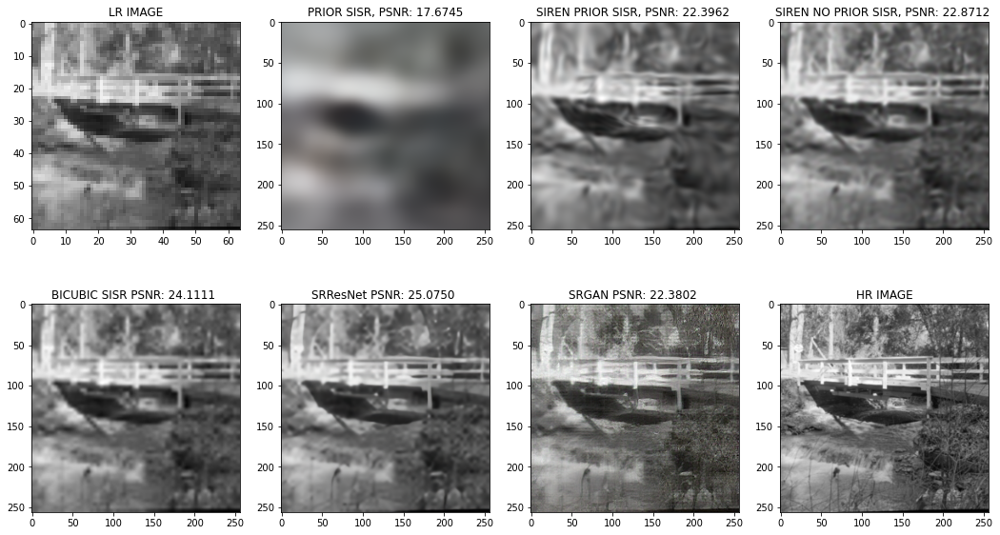

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 9/14 - 64.29%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:2:30 / 0:3:53


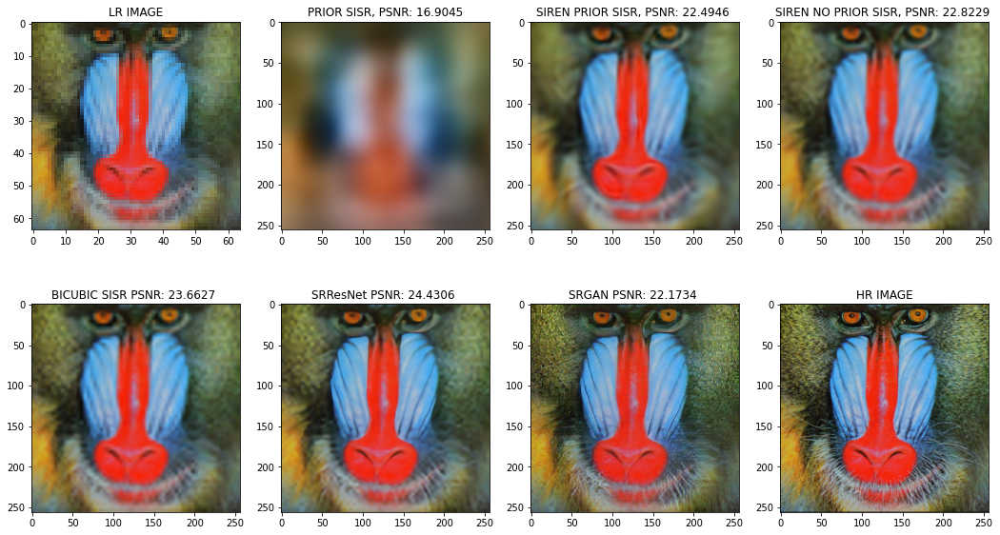

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 10/14 - 71.43%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:2:46 / 0:3:53


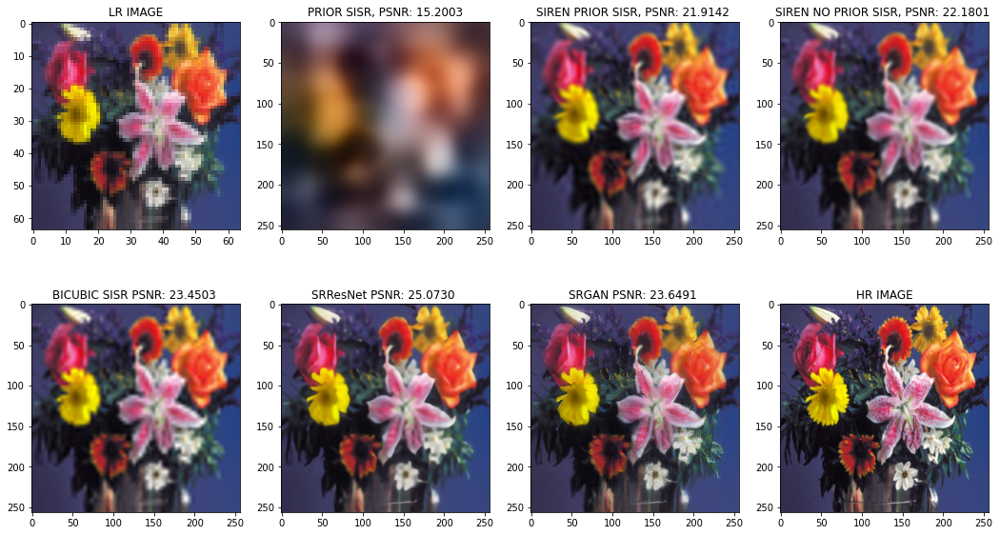

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 11/14 - 78.57%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:3:3 / 0:3:53


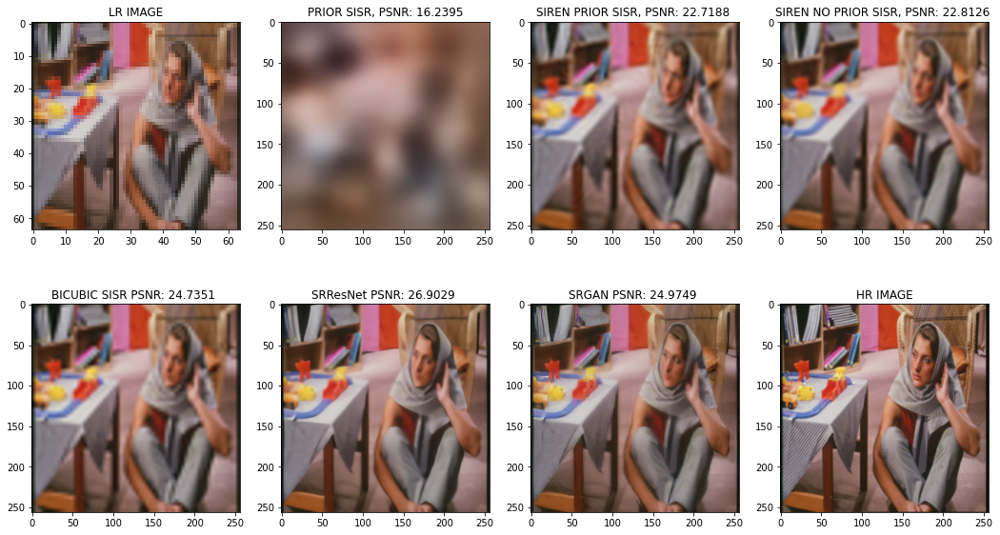

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 12/14 - 85.71%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:3:20 / 0:3:54


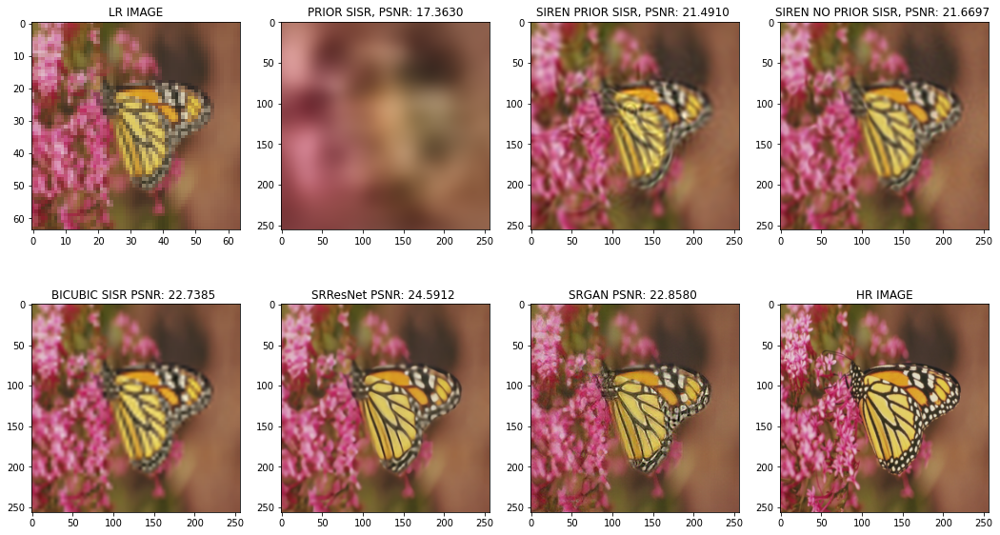

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 13/14 - 92.86%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:3:34 / 0:3:51


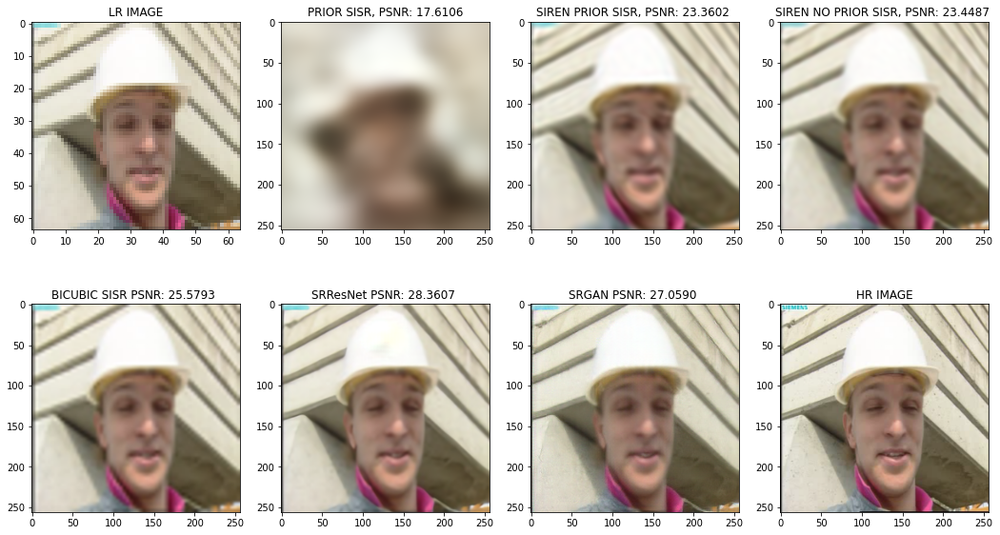

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
[image 14/14 - 100.00%]
torch.Size([256, 256, 3])
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srgan.pth
Running on GPU 0
Restored checkpoint from srgan/resources/pretrained/srresnet.pth
Estimated time: 0:3:51 / 0:3:51


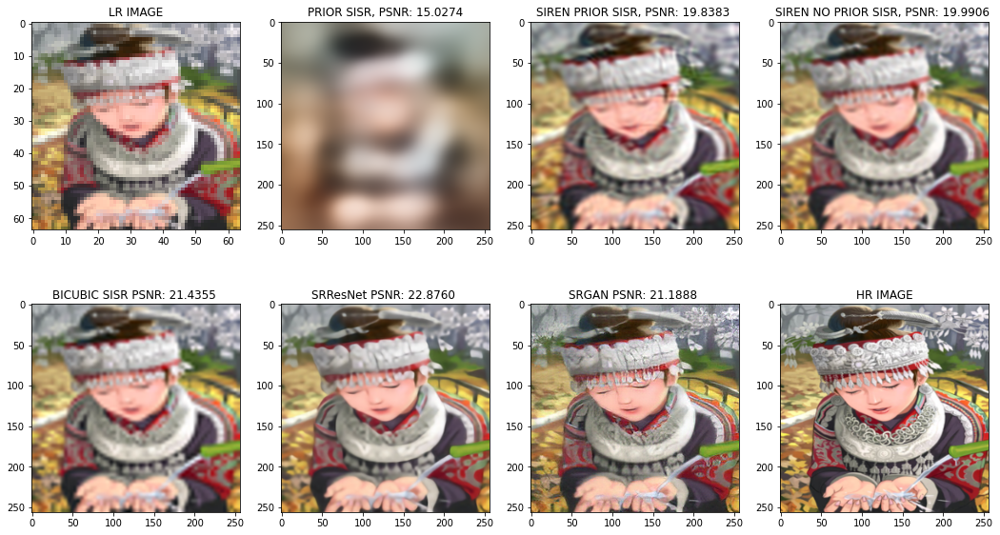

CUDA-0 used memory [1288429056 bytes / 16914055168 bytes (7.62%)]
Average psnr prior: 16.897250591178274
Average psnr siren prior: 22.5477328952375
Average psnr siren no prior: 22.783302500128322
Average psnr bicubic: 24.330015808260857
Average psnr srresnet: 26.125759315859714
Average psnr srgan: 23.941421272000408


In [ ]:
import copy
print_CUDA_memory_statistics()
max_test_images = 14

# load real image
test_dataloader = DataLoader(TestImageFitting_RGB(datasetTestPath, width_LR, height_LR, factor, max = max_test_images), batch_size=1, pin_memory=True, num_workers=0, shuffle=False)

estimator = Time_estimator(total_steps = max_test_images, steps_til_summary = 1)

all_psnr_prior = []
all_psnr_siren_prior = []
all_psnr_siren_no_prior = []
all_psnr_bicubic = []
all_psnr_srresnet = []
all_psnr_srgan = []

iter = 0
for input_grid_LR, input_grid_HR, ground_truth_HR, ground_truth_LR, original_ground_truth_LR, filename in test_dataloader:
    iter += 1
    input_grid_LR = input_grid_LR.cuda()
    input_grid_HR = input_grid_HR.cuda()
    ground_truth_HR = ground_truth_HR.cuda()
    ground_truth_LR = ground_truth_LR.cuda()
    original_ground_truth_LR = original_ground_truth_LR.cuda()

    output_prior_image, _, weight_prior, bias_prior, _ = hyper_siren(original_ground_truth_LR, input_grid_HR)

    #SIREN TRAIN WITH PRIOR --------------------------------------------------------
    img_siren = Basic_Siren(in_features=2, out_features=3, hidden_features=hidden_features, hidden_layers=3, first_omega_0=30, 
                            hidden_omega_0=30, w = weight_prior, b = bias_prior)
    img_siren.cuda()
    train(img_siren, input_grid_LR, ground_truth_LR, name = os.path.basename(filename[0]) + "/test_prior", writer = writer, 
          lr = 0.0001, gamma = 0.1, width = width_LR, height = height_LR, total_steps = 1500)

    siren_output_HR_prior, _ = img_siren(input_grid_HR)

    #SIREN TRAIN WITHOUT PRIOR -----------------------------------------------------
    img_siren = Basic_Siren(in_features=2, out_features=3, hidden_features=hidden_features, hidden_layers=3, first_omega_0=30, hidden_omega_0=30)
    img_siren.cuda()
    train(img_siren, input_grid_LR, ground_truth_LR, name = os.path.basename(filename[0]) + "/test_no_prior", writer = writer, 
          lr = 0.0001, gamma = 0.1, width = width_LR, height = height_LR, total_steps = 1500)

    siren_output_HR_no_prior, _ = img_siren(input_grid_HR)
    
    print("[image {}/{} - {:.2%}]".format(iter, max_test_images, iter/max_test_images))

    # computing PSNR PRIOR
    psnr_prior = psnr(target = ground_truth_HR, input = output_prior_image)
    all_psnr_prior.append(psnr_prior)

    # computing PSNR SIREN with prior
    psnr_siren_prior = psnr(target = ground_truth_HR, input = siren_output_HR_prior)
    all_psnr_siren_prior.append(psnr_siren_prior)

    # computing PSNR SIREN with no prior
    psnr_siren_no_prior = psnr(target = ground_truth_HR, input = siren_output_HR_no_prior)
    all_psnr_siren_no_prior.append(psnr_siren_no_prior)
    
    # computing PSNR BICUBIC
    print(get_bicubic_image(filename[0], width_LR, height_LR, width_HR, height_HR).permute(1, 2, 0).shape)
    bicubic_output = get_bicubic_image(filename[0], width_LR, height_LR, width_HR, height_HR).permute(1, 2, 0).view(-1, 3)
    bicubic_output = bicubic_output.cuda()

    psnr_bicubic = psnr(target = ground_truth_HR, input = bicubic_output)
    all_psnr_bicubic.append(psnr_bicubic)

    # Save temp image for SRGAN and SRResNet
    save_image(ground_truth_LR.squeeze().view(height_LR, width_LR, 3).permute(2, 0, 1), 'srgan/pred/tmp.png', nrow=4)

    from srgan import eval

    # computing PSNR SRGAN
    srgan = getSRGAN('srgan/pred/tmp.png', height_HR, width_HR)
    srgan = srgan.cuda()
    psnr_srgan = psnr(target = ground_truth_HR, input = srgan)
    all_psnr_srgan.append(psnr_srgan)

    # computing PSNR SRResNet
    srresnet = getSRRESNET('srgan/pred/tmp.png', height_HR, width_HR)
    srresnet = srresnet.cuda()
    psnr_srresnet = psnr(target = ground_truth_HR, input = srresnet)
    all_psnr_srresnet.append(psnr_srresnet)


    # PLOT result
    fig, axes = plt.subplots(2,4, figsize=(18,10))
    axes[0,0].set_title("LR IMAGE")
    axes[0,0].imshow(ground_truth_LR.cpu().view(height_LR, width_LR, 3).detach().numpy())
    axes[0,1].set_title("PRIOR SISR, PSNR: %0.4f" %psnr_prior)
    axes[0,1].imshow(torch.clamp(output_prior_image.cpu(), min=0, max=1).view(height_HR, width_HR, 3).detach().numpy())
    axes[0,2].set_title("SIREN PRIOR SISR, PSNR: %0.4f " % psnr_siren_prior)
    axes[0,2].imshow(torch.clamp(siren_output_HR_prior.cpu(), min=0, max=1).view(height_HR, width_HR, 3).detach().numpy())
    axes[0,3].set_title("SIREN NO PRIOR SISR, PSNR: %0.4f " % psnr_siren_no_prior)
    axes[0,3].imshow(torch.clamp(siren_output_HR_no_prior.cpu(), min=0, max=1).view(height_HR, width_HR, 3).detach().numpy())

    axes[1,0].set_title("BICUBIC SISR PSNR: %0.4f " % psnr_bicubic)
    axes[1,0].imshow(bicubic_output.cpu().view(height_HR, width_HR,3).detach().numpy())
    axes[1,1].set_title("SRResNet PSNR: %0.4f " % psnr_srresnet)
    axes[1,1].imshow(srresnet.cpu().view(height_HR, width_HR,3).detach().numpy())
    axes[1,2].set_title("SRGAN PSNR: %0.4f " % psnr_srgan)
    axes[1,2].imshow(srgan.cpu().view(height_HR, width_HR,3).detach().numpy())
    axes[1,3].set_title("HR IMAGE")
    axes[1,3].imshow(ground_truth_HR.cpu().view(height_HR, width_HR,3).detach().numpy())

    estimator.checkpoint(iter)

    plt.show()

    print_CUDA_memory_statistics()

all_psnr_prior = np.array(all_psnr_prior)
all_psnr_siren_prior = np.array(all_psnr_siren_prior)
all_psnr_siren_no_prior = np.array(all_psnr_siren_no_prior)
all_psnr_bicubic = np.array(all_psnr_bicubic)
all_psnr_srresnet = np.array(all_psnr_srresnet)
all_psnr_srgan = np.array(all_psnr_srgan)

for i in range(max_test_images):
    writer.add_scalars("psnr_test",{
        "psnr_prior": all_psnr_prior[i],
        "psnr_siren_prior": all_psnr_siren_prior[i],
        "psnr_siren_no_prior": all_psnr_siren_no_prior[i],
        "psnr_bicubic": all_psnr_bicubic[i],
        "psnr_srresnet": all_psnr_srresnet[i],
        "psnr_srgan": all_psnr_srgan[i],
    }, i)
    writer.flush();

avg_psnr_prior = all_psnr_prior.mean()
avg_psnr_siren_prior = all_psnr_siren_prior.mean()
avg_psnr_siren_no_prior = all_psnr_siren_no_prior.mean()
avg_psnr_bicubic = all_psnr_bicubic.mean()
avg_psnr_srresnet = all_psnr_srresnet.mean()
avg_psnr_srgan = all_psnr_srgan.mean()

print("Average psnr prior: {}".format(avg_psnr_prior))
print("Average psnr siren prior: {}".format(avg_psnr_siren_prior))
print("Average psnr siren no prior: {}".format(avg_psnr_siren_no_prior))
print("Average psnr bicubic: {}".format(avg_psnr_bicubic))
print("Average psnr srresnet: {}".format(avg_psnr_srresnet))
print("Average psnr srgan: {}".format(avg_psnr_srgan))

In [ ]:
#writer.close()
%tensorboard --logdir {writer_folder}

Reusing TensorBoard on port 6006 (pid 2207), started 5:19:16 ago. (Use '!kill 2207' to kill it.)

<IPython.core.display.Javascript object>